In [1]:
import os
import glob
import time
import numpy as np
from PIL import Image
from pathlib import Path
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from skimage.color import rgb2lab, lab2rgb
Path.ls = lambda x: list(x.iterdir())
from dataset import make_lab_dataloaders
import cv2
from visualize_model import visualize


import torch
from torch import nn, optim
from torchvision import transforms
from torchvision.utils import make_grid
from torch.utils.data import Dataset, DataLoader
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

import warnings
warnings.filterwarnings("ignore")

print(device)

cuda


In [2]:
torch.manual_seed(42)
np.random.seed(42)

In [3]:
VAL_SIZE = 0.2
TEST_SIZE = 0.2

In [4]:
from sklearn.model_selection import train_test_split

paths = glob.glob("dataset/*.jpg")
paths_subset = np.random.choice(paths, len(paths), replace=False)

train_paths, test_paths = train_test_split(paths_subset,test_size=TEST_SIZE,shuffle=True)
train_paths, val_paths = train_test_split(train_paths,test_size=VAL_SIZE / (1- TEST_SIZE),shuffle=True)


print(len(train_paths), len(val_paths), len(test_paths))

5904 1968 1968


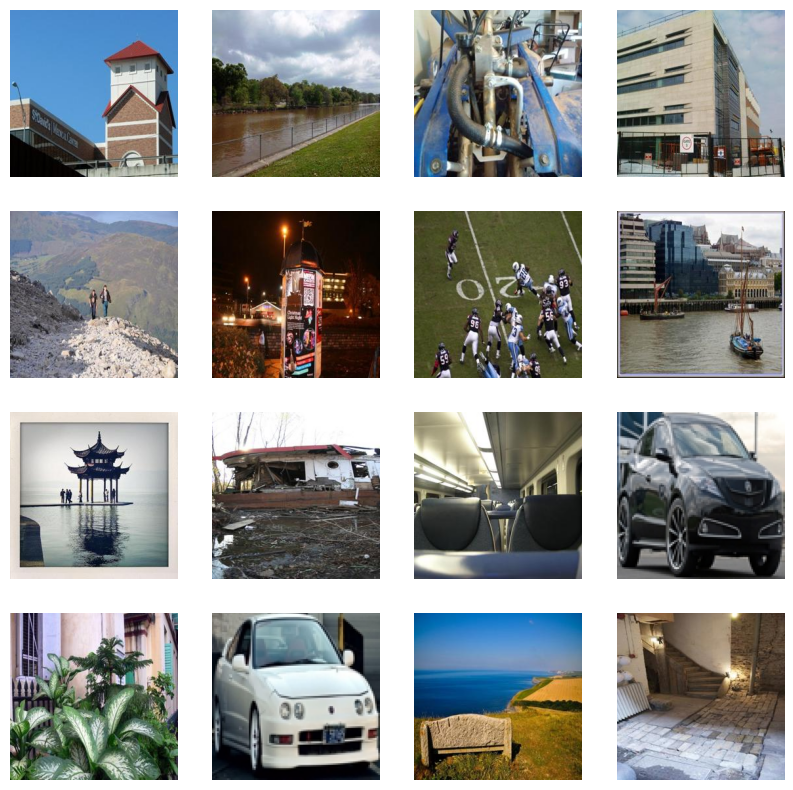

In [5]:
_, axes = plt.subplots(4, 4, figsize=(10, 10))
for ax, img_path in zip(axes.flatten(), train_paths):
    ax.imshow(Image.open(img_path))
    ax.axis("off")

In [6]:
SIZE = 256

In [7]:
train_dl = make_lab_dataloaders(paths=train_paths, split='train')
val_dl = make_lab_dataloaders(paths=val_paths, split='val')
test_dl = make_lab_dataloaders(paths=test_paths, split='test')

print(next(iter(train_dl)))
data = next(iter(train_dl))
Ls, abs_ = data['L'], data['ab']
print(Ls.shape, abs_.shape)
print(len(train_dl), len(val_dl), len(test_dl))

{'L': tensor([[[[ 0.0952,  0.0952,  0.0952,  ...,  0.1383,  0.1383,  0.1383],
          [ 0.0952,  0.0952,  0.0952,  ...,  0.1383,  0.1383,  0.1383],
          [ 0.0952,  0.0952,  0.0952,  ...,  0.1383,  0.1383,  0.1383],
          ...,
          [ 0.5378,  0.5159,  0.5159,  ..., -0.9918, -0.9973, -0.9988],
          [ 0.5887,  0.5742,  0.5670,  ..., -0.9918, -0.9973, -0.9988],
          [ 0.5524,  0.5597,  0.5815,  ..., -0.9918, -0.9973, -0.9988]]],


        [[[ 0.4198,  0.4124,  0.4097,  ...,  0.4260,  0.4260,  0.4187],
          [ 0.4198,  0.4198,  0.4097,  ...,  0.4187,  0.4113,  0.4113],
          [ 0.4272,  0.4272,  0.4171,  ...,  0.4038,  0.3964,  0.3964],
          ...,
          [-0.3057, -0.3227, -0.3588,  ..., -0.6555, -0.4015, -0.4448],
          [-0.3588, -0.3760, -0.4106,  ..., -0.5907, -0.7048, -0.5302],
          [-0.4631, -0.3760, -0.2656,  ..., -0.4921, -0.5566, -0.7428]]],


        [[[ 0.7402,  0.7473,  0.7451,  ...,  0.2840,  0.2832,  0.2224],
          [ 0.7402, 

In [8]:
class UnetBlock(nn.Module):
    def __init__(self, nf, ni, submodule=None, input_c=None, dropout=False,
                 innermost=False, outermost=False):
        super().__init__()
        self.outermost = outermost
        if input_c is None: input_c = nf
        downconv = nn.Conv2d(input_c, ni, kernel_size=4,
                             stride=2, padding=1, bias=False)
        downrelu = nn.LeakyReLU(0.2, True)
        downnorm = nn.BatchNorm2d(ni)
        uprelu = nn.ReLU(True)
        upnorm = nn.BatchNorm2d(nf)

        if outermost:
            upconv = nn.ConvTranspose2d(ni * 2, nf, kernel_size=4,
                                        stride=2, padding=1)
            down = [downconv]
            up = [uprelu, upconv, nn.Tanh()]
            model = down + [submodule] + up
        elif innermost:
            upconv = nn.ConvTranspose2d(ni, nf, kernel_size=4,
                                        stride=2, padding=1, bias=False)
            down = [downrelu, downconv]
            up = [uprelu, upconv, upnorm]
            model = down + up
        else:
            upconv = nn.ConvTranspose2d(ni * 2, nf, kernel_size=4,
                                        stride=2, padding=1, bias=False)
            down = [downrelu, downconv, downnorm]
            up = [uprelu, upconv, upnorm]
            if dropout: up += [nn.Dropout(0.5)]
            model = down + [submodule] + up
        self.model = nn.Sequential(*model)

    def forward(self, x):
        if self.outermost:
            return self.model(x)
        else:
            return torch.cat([x, self.model(x)], 1)

In [9]:
class Unet(nn.Module):
    def __init__(self, input_c=1, output_c=2, n_down=8, num_filters=64):
        super().__init__()
        unet_block = UnetBlock(num_filters * 8, num_filters * 8, innermost=True)
        for _ in range(n_down - 5):
            unet_block = UnetBlock(num_filters * 8, num_filters * 8, submodule=unet_block, dropout=True)
        out_filters = num_filters * 8
        for _ in range(3):
            unet_block = UnetBlock(out_filters // 2, out_filters, submodule=unet_block)
            out_filters //= 2
        self.model = UnetBlock(output_c, out_filters, input_c=input_c, submodule=unet_block, outermost=True)

    def forward(self, x):
        return self.model(x)

In [10]:
class PatchDiscriminator(nn.Module):
    def __init__(self, input_c, num_filters=64, n_down=3):
        super().__init__()
        model = [self.get_layers(input_c, num_filters, norm=False)]
        model += [self.get_layers(num_filters * 2 ** i, num_filters * 2 ** (i + 1), s=1 if i == (n_down-1) else 2)
                  for i in range(n_down)] # the 'if' statement is taking care of not using
        # stride of 2 for the last block in this loop
        model += [self.get_layers(num_filters * 2 ** n_down, 1, s=1, norm=False, act=False)] # Make sure to not use normalization or
        # activation for the last layer of the model
        self.model = nn.Sequential(*model)

    def get_layers(self, ni, nf, k=4, s=2, p=1, norm=True, act=True): # when needing to make some repeatitive blocks of layers,
        layers = [nn.Conv2d(ni, nf, k, s, p, bias=not norm)]          # it's always helpful to make a separate method for that purpose
        if norm: layers += [nn.BatchNorm2d(nf)]
        if act: layers += [nn.LeakyReLU(0.2, True)]
        return nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)

In [11]:
class GANLoss(nn.Module):
    def __init__(self, gan_mode='vanilla', real_label=1.0, fake_label=0.0):
        super().__init__()
        self.register_buffer('real_label', torch.tensor(real_label))
        self.register_buffer('fake_label', torch.tensor(fake_label))
        if gan_mode == 'vanilla':
            self.loss = nn.BCEWithLogitsLoss()
        elif gan_mode == 'lsgan':
            self.loss = nn.MSELoss()

    def get_labels(self, preds, target_is_real):
        if target_is_real:
            labels = self.real_label
        else:
            labels = self.fake_label
        return labels.expand_as(preds)

    def __call__(self, preds, target_is_real):
        labels = self.get_labels(preds, target_is_real)
        loss = self.loss(preds, labels)
        return loss

In [12]:
def init_weights(net, init='norm', gain=0.02):

    def init_func(m):
        classname = m.__class__.__name__
        if hasattr(m, 'weight') and 'Conv' in classname:
            if init == 'norm':
                nn.init.normal_(m.weight.data, mean=0.0, std=gain)
            elif init == 'xavier':
                nn.init.xavier_normal_(m.weight.data, gain=gain)
            elif init == 'kaiming':
                nn.init.kaiming_normal_(m.weight.data, a=0, mode='fan_in')

            if hasattr(m, 'bias') and m.bias is not None:
                nn.init.constant_(m.bias.data, 0.0)
        elif 'BatchNorm2d' in classname:
            nn.init.normal_(m.weight.data, 1., gain)
            nn.init.constant_(m.bias.data, 0.)

    net.apply(init_func)
    print(f"model initialized with {init} initialization")
    return net

def init_model(model, device):
    model = model.to(device)
    model = init_weights(model)
    return model

In [13]:
class MainModel(nn.Module):
    def __init__(self, net_G=None, lr_G=2e-4, lr_D=2e-4,
                 beta1=0.5, beta2=0.999, lambda_L1=100.):
        super().__init__()

        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.lambda_L1 = lambda_L1

        if net_G is None:
            self.net_G = init_model(Unet(input_c=1, output_c=2, n_down=8, num_filters=64), self.device)
        else:
            self.net_G = net_G.to(self.device)
        self.net_D = init_model(PatchDiscriminator(input_c=3, n_down=3, num_filters=64), self.device)
        self.GANcriterion = GANLoss(gan_mode='vanilla').to(self.device)
        self.L1criterion = nn.L1Loss()
        self.opt_G = optim.Adam(self.net_G.parameters(), lr=lr_G, betas=(beta1, beta2))
        self.opt_D = optim.Adam(self.net_D.parameters(), lr=lr_D, betas=(beta1, beta2))

    def set_requires_grad(self, model, requires_grad=True):
        for p in model.parameters():
            p.requires_grad = requires_grad

    def setup_input(self, data):
        self.L = data['L'].to(self.device)
        self.ab = data['ab'].to(self.device)

    def forward(self):
        self.fake_color = self.net_G(self.L)

    def backward_D(self):
        fake_image = torch.cat([self.L, self.fake_color], dim=1)
        fake_preds = self.net_D(fake_image.detach())
        self.loss_D_fake = self.GANcriterion(fake_preds, False)
        real_image = torch.cat([self.L, self.ab], dim=1)
        real_preds = self.net_D(real_image)
        self.loss_D_real = self.GANcriterion(real_preds, True)
        self.loss_D = (self.loss_D_fake + self.loss_D_real) * 0.5
        self.loss_D.backward()

    def backward_G(self):
        fake_image = torch.cat([self.L, self.fake_color], dim=1)
        fake_preds = self.net_D(fake_image)
        self.loss_G_GAN = self.GANcriterion(fake_preds, True)
        self.loss_G_L1 = self.L1criterion(self.fake_color, self.ab) * self.lambda_L1
        self.loss_G = self.loss_G_GAN + self.loss_G_L1
        self.loss_G.backward()

    def optimize(self):
        self.forward()
        self.net_D.train()
        self.set_requires_grad(self.net_D, True)
        self.opt_D.zero_grad()
        self.backward_D()
        self.opt_D.step()

        self.net_G.train()
        self.set_requires_grad(self.net_D, False)
        self.opt_G.zero_grad()
        self.backward_G()
        self.opt_G.step()

In [14]:
class AverageMeter:
    def __init__(self):
        self.reset()

    def reset(self):
        self.count, self.avg, self.sum = [0.] * 3

    def update(self, val, count=1):
        self.count += count
        self.sum += count * val
        self.avg = self.sum / self.count

def create_loss_meters():
    loss_D_fake = AverageMeter()
    loss_D_real = AverageMeter()
    loss_D = AverageMeter()
    loss_G_GAN = AverageMeter()
    loss_G_L1 = AverageMeter()
    loss_G = AverageMeter()

    return {'loss_D_fake': loss_D_fake,
            'loss_D_real': loss_D_real,
            'loss_D': loss_D,
            'loss_G_GAN': loss_G_GAN,
            'loss_G_L1': loss_G_L1,
            'loss_G': loss_G}

def update_losses(model, loss_meter_dict, count):
    for loss_name, loss_meter in loss_meter_dict.items():
        loss = getattr(model, loss_name)
        loss_meter.update(loss.item(), count=count)


def log_results(loss_meter_dict):
    for loss_name, loss_meter in loss_meter_dict.items():
        print(f"{loss_name}: {loss_meter.avg:.5f}")

model initialized with norm initialization
model initialized with norm initialization


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]


Epoch 1/50
Iteration 1/369
loss_D_fake: 1.22540
loss_D_real: 0.49885
loss_D: 0.86212
loss_G_GAN: 1.21175
loss_G_L1: 17.85242
loss_G: 19.06416


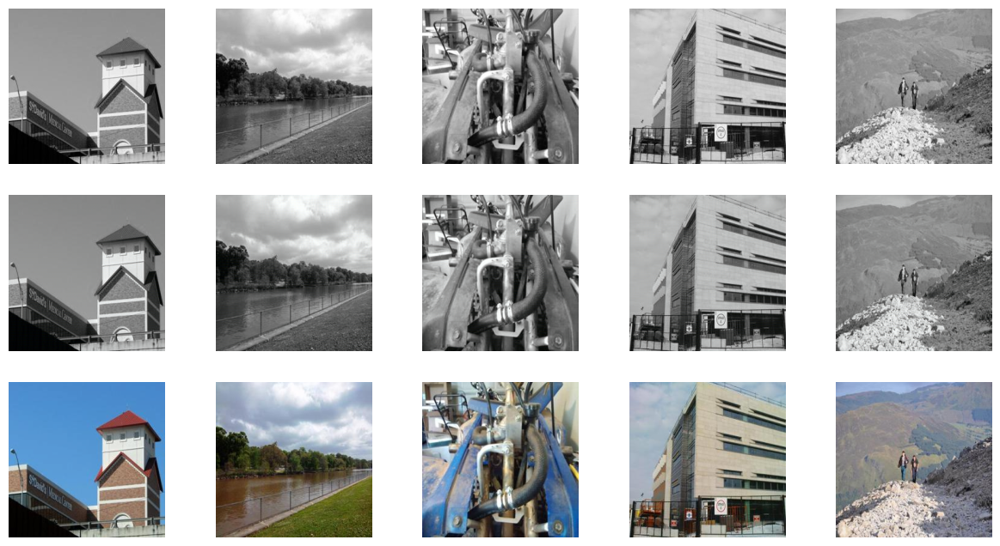

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]


Epoch 6/50
Iteration 1/369
loss_D_fake: 0.71300
loss_D_real: 0.76692
loss_D: 0.73996
loss_G_GAN: 1.16579
loss_G_L1: 8.57902
loss_G: 9.74480


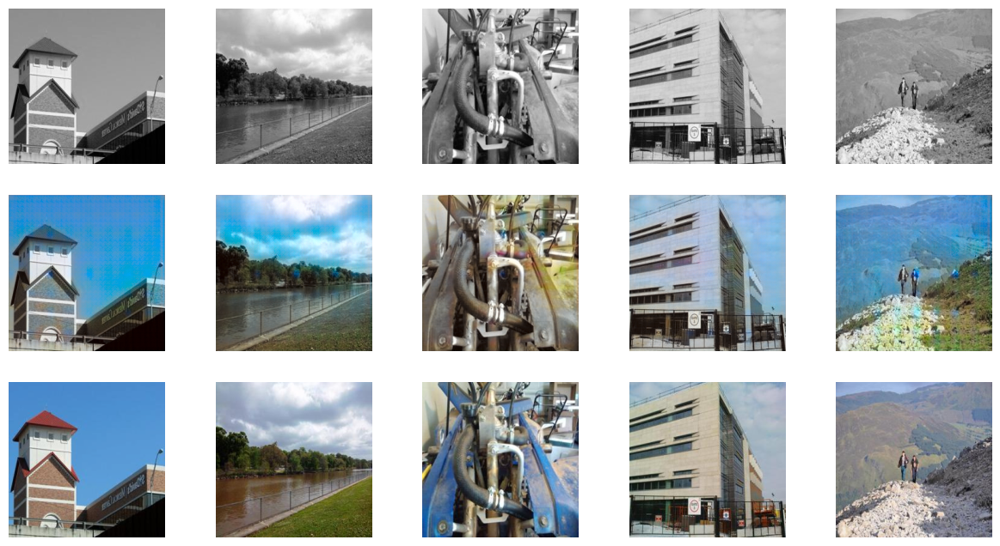

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]


Epoch 11/50
Iteration 1/369
loss_D_fake: 0.76375
loss_D_real: 0.64918
loss_D: 0.70647
loss_G_GAN: 0.80253
loss_G_L1: 7.70810
loss_G: 8.51063


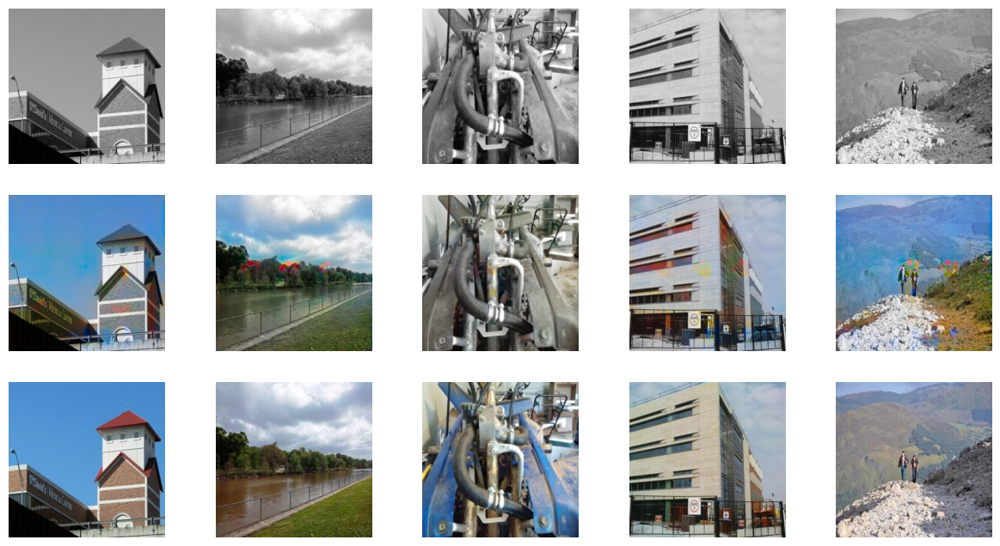

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]


Epoch 16/50
Iteration 1/369
loss_D_fake: 0.80993
loss_D_real: 0.59711
loss_D: 0.70352
loss_G_GAN: 0.69011
loss_G_L1: 7.42266
loss_G: 8.11277


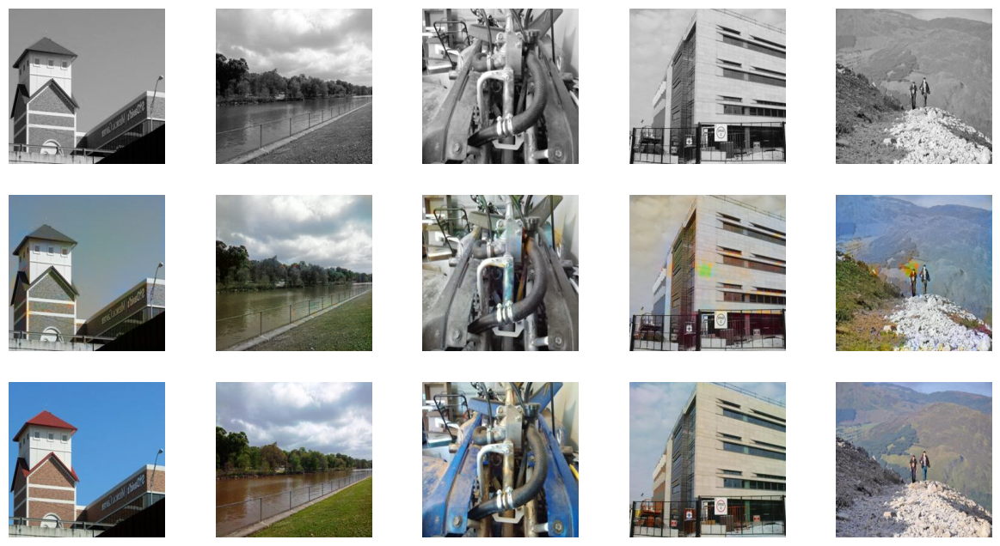

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]


Epoch 21/50
Iteration 1/369
loss_D_fake: 0.67916
loss_D_real: 0.66551
loss_D: 0.67234
loss_G_GAN: 0.73273
loss_G_L1: 7.01342
loss_G: 7.74615


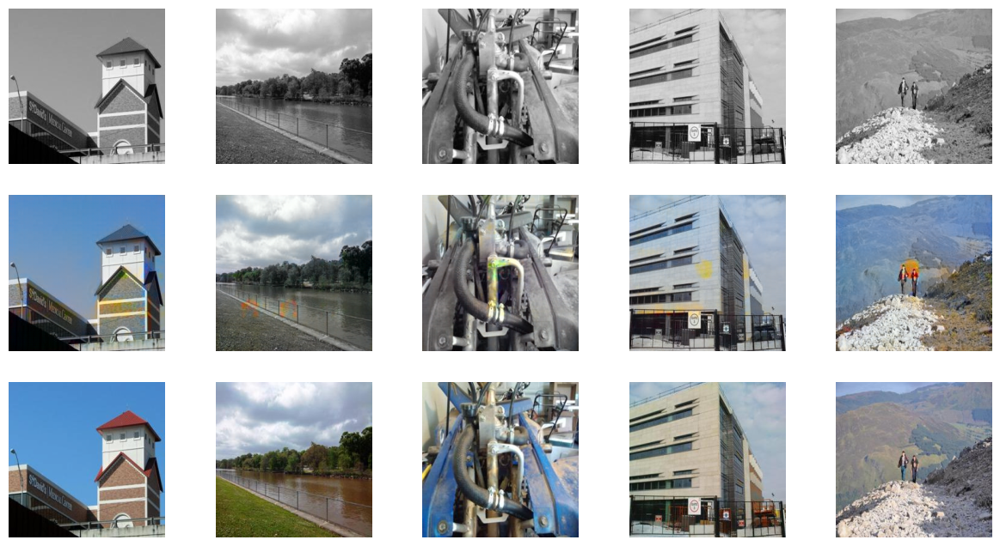

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]


Epoch 26/50
Iteration 1/369
loss_D_fake: 0.73306
loss_D_real: 0.58470
loss_D: 0.65888
loss_G_GAN: 0.93468
loss_G_L1: 7.06845
loss_G: 8.00313


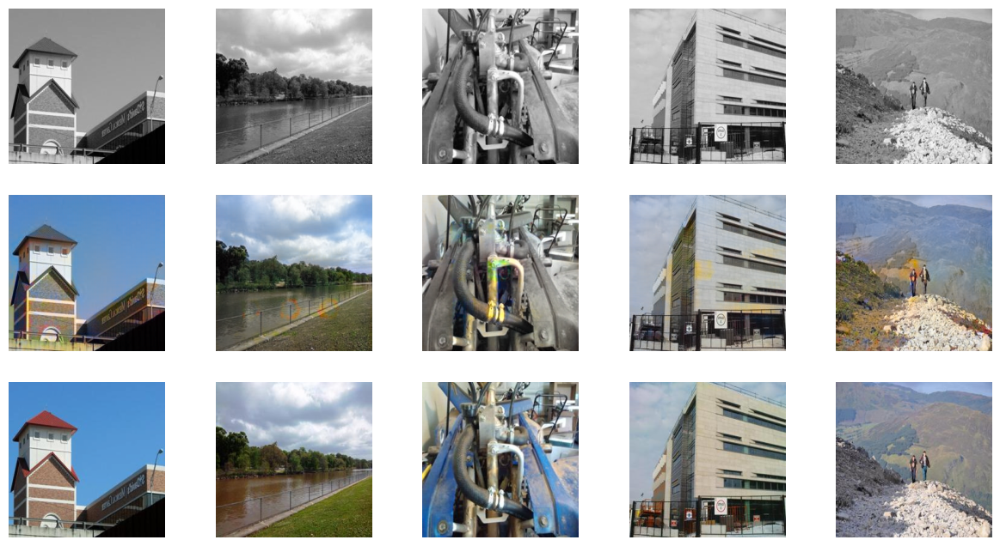

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]


Epoch 31/50
Iteration 1/369
loss_D_fake: 0.73786
loss_D_real: 0.46309
loss_D: 0.60048
loss_G_GAN: 0.94377
loss_G_L1: 6.02390
loss_G: 6.96768


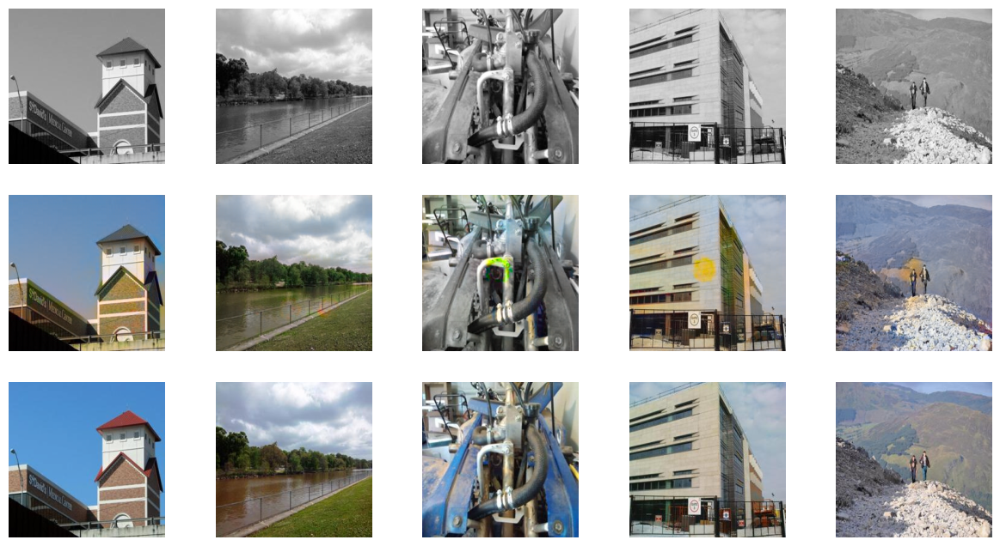

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]


Epoch 36/50
Iteration 1/369
loss_D_fake: 0.64766
loss_D_real: 0.54028
loss_D: 0.59397
loss_G_GAN: 0.90149
loss_G_L1: 6.00328
loss_G: 6.90478


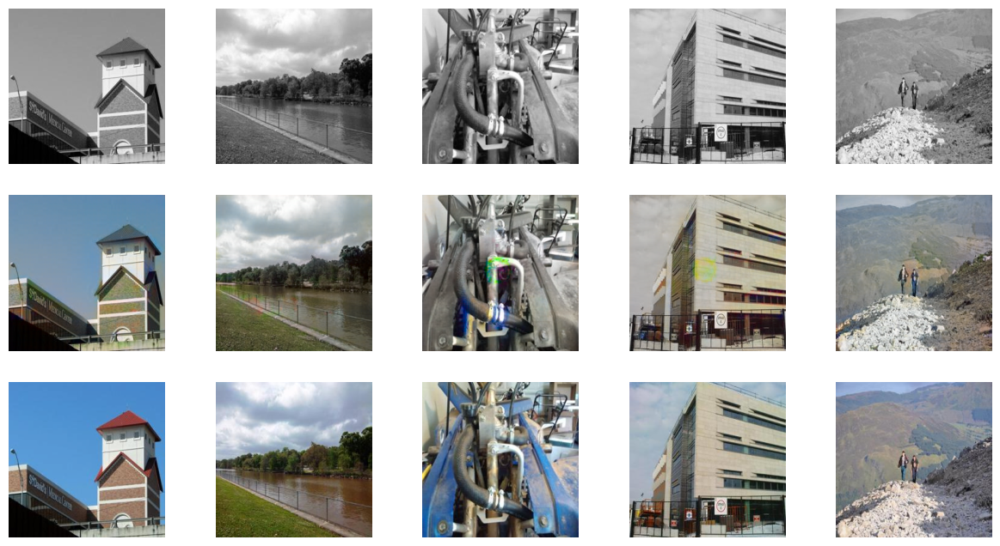

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]


Epoch 41/50
Iteration 1/369
loss_D_fake: 0.54509
loss_D_real: 0.57020
loss_D: 0.55764
loss_G_GAN: 0.84524
loss_G_L1: 5.20009
loss_G: 6.04533


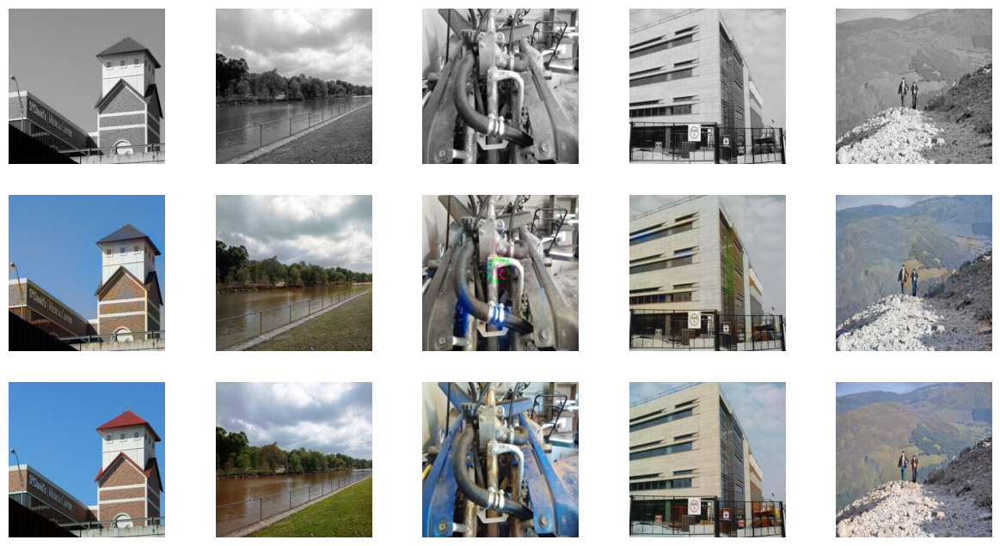

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]


Epoch 46/50
Iteration 1/369
loss_D_fake: 0.68450
loss_D_real: 0.52467
loss_D: 0.60459
loss_G_GAN: 0.82452
loss_G_L1: 4.95684
loss_G: 5.78136


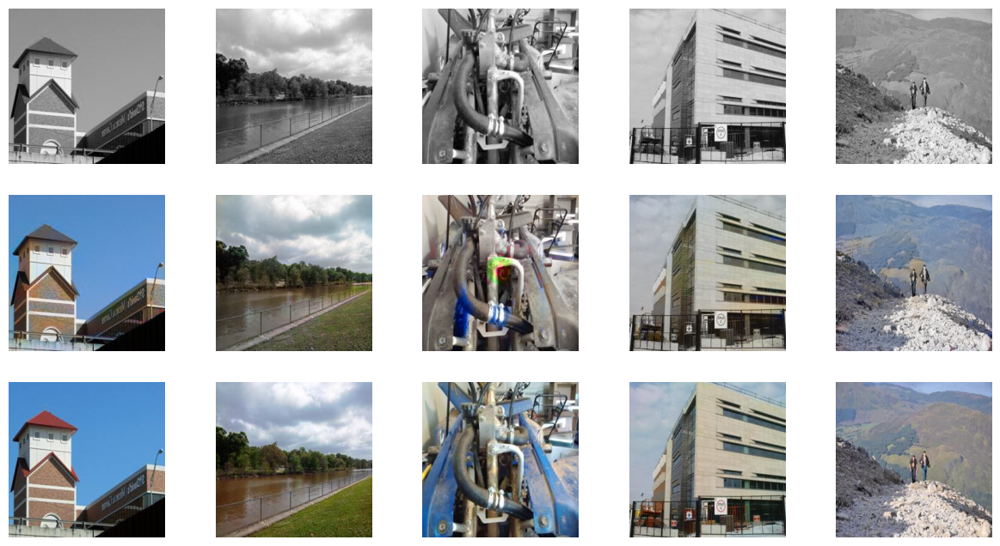

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]

  0%|          | 0/369 [00:00<?, ?it/s]

In [15]:
def train_model(model, train_dl, epochs, display_every=5):
    data = next(iter(val_dl)) # getting a batch for visualizing the model output after fixed intrvals
    for e in tqdm(range(epochs)):
        loss_meter_dict = create_loss_meters() # function returing a dictionary of objects to
        i = 0                                  # log the losses of the complete network
        for data in tqdm(train_dl, leave=False):
            model.setup_input(data)
            model.optimize()
            update_losses(model, loss_meter_dict, count=data['L'].size(0)) # function updating the log objects
            i += 1
            if i == 1 and e % display_every == 0:
                print(f"\nEpoch {e+1}/{epochs}")
                print(f"Iteration {i}/{len(train_dl)}")
                log_results(loss_meter_dict) # function to print out the losses
                visualize(model, data, save=False) # function displaying the model's outputs

model = MainModel()
train_model(model, train_dl, 50)

In [16]:
data = next(iter(test_dl))

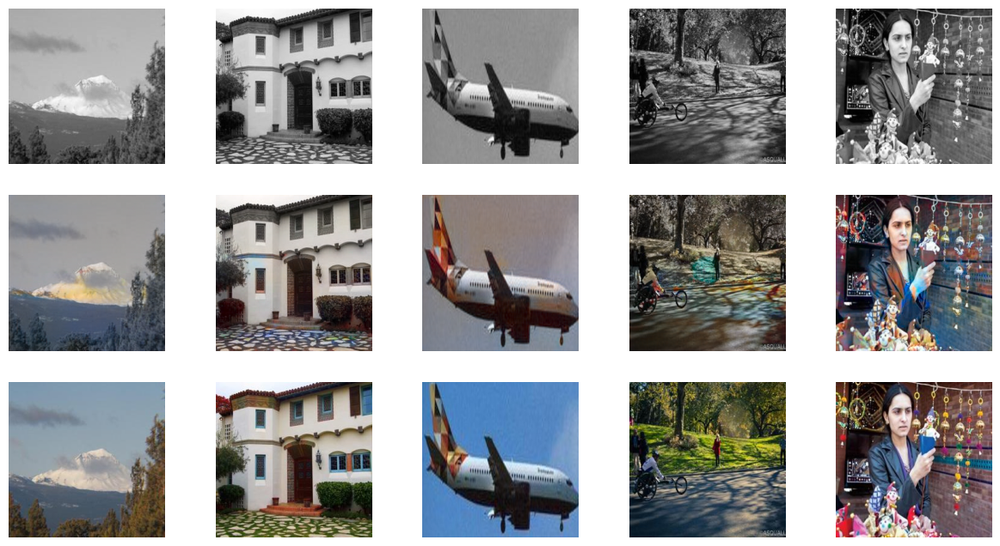

In [17]:
visualize(model, data, save=True)

In [18]:
torch.save(model.state_dict(), "models/lab/gan_model.pth")